In [42]:
import pandas as pd
import os
import warnings
from tqdm.notebook import tqdm
import re
import geopandas as gpd
from shapely.geometry import Point
import pyproj
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import xarray as xr
import glob
from geopy.distance import geodesic
import numpy as np

from scripts.plots import *

from pathlib import Path
#from cmcrameri import cm
from calendar import monthrange


warnings.filterwarnings('ignore')
%load_ext autoreload
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
seed_all(cfg.seed)
free_up_cuda()

# Plot styles:
path_style_sheet = 'scripts/example.mplstyle'
plt.style.use(path_style_sheet)

cmap = cm.devon

# For bars and lines:
color_diff_xgb = '#4d4d4d'

colors = get_cmap_hex(cm.batlow, 10)
color_1 = colors[0]
color_2 = '#c51b7d'

NameError: name 'cfg' is not defined

## 1. Load in available datasets

In [32]:
data_CH = pd.read_csv('/home/mburlet/scratch/data/GLAMOS/point/csv/CH_wgms_dataset_all.csv')
data_FR = pd.read_csv('/home/mburlet/scratch/data/DATA_MB/GLACIOCLIM/WGMS_all/FR_wgms_dataset_all_oggm.csv')
data_IT_AT = pd.read_csv('/home/mburlet/scratch/data/DATA_MB/WGMS/DOI-WGMS-FoG-2025-02b/csv/IT_AT_wgms_dataset_all_oggm.csv')
data_IT = data_IT_AT[data_IT_AT['POINT_ID'].str.endswith('_IT')]
data_AT = data_IT_AT[data_IT_AT['POINT_ID'].str.endswith('_AT')]
data_NOR = pd.read_csv('/home/mburlet/scratch/data/DATA_MB/WGMS/Norway/csv/Nor_dataset_all_oggm.csv')

display(data_NOR.head(2))

,POINT_LAT,POINT_LON,POINT_ELEVATION,FROM_DATE,TO_DATE,POINT_BALANCE,PERIOD,RGIId,YEAR,GLACIER,aspect,slope,topo,hugonnet_dhdt,consensus_ice_thickness,POINT_ID
0,70.12589,21.77702,471,20120925,20131107,-4.92,annual,RGI60-08.01258,2013,Langfjordjoekulen,36.073272,15.972541,425.458893,-3.314563,96.980293,Langfjordjoekulen_2013_annual_0
1,70.12578,21.77630,439,20131107,20140924,-2.67,annual,RGI60-08.01258,2014,Langfjordjoekulen,33.570984,16.993369,434.652008,-2.934460,89.294670,Langfjordjoekulen_2014_annual_1


In [67]:
display(data_AT[data_AT['POINT_ELEVATION'] < 500])

display(np.sort(data_AT[data_AT['GLACIER'] == 'VERNAGT F.']['POINT_ELEVATION'].unique()))

,POINT_ID,POINT_LAT,POINT_LON,POINT_ELEVATION,FROM_DATE,TO_DATE,POINT_BALANCE,GLACIER,PERIOD,RGIId,YEAR,aspect,slope,topo,hugonnet_dhdt,consensus_ice_thickness
1588,VERNAGT F._2013_15124_AT,46.865219,10.81066,296.0,20120701,20130702,0.874,VERNAGT F.,winter,RGI60-11.00719,2013,50.294269,11.569804,2971.0,-1.802882,53.383244


array([ 296., 2820., 2844., 2845., 2866., 2867., 2870., 2874., 2876.,
       2877., 2879., 2880., 2883., 2885., 2891., 2893., 2894., 2897.,
       2898., 2899., 2900., 2901., 2902., 2903., 2904., 2905., 2906.,
       2908., 2909., 2910., 2911., 2912., 2913., 2914., 2915., 2919.,
       2920., 2922., 2923., 2924., 2925., 2926., 2927., 2928., 2929.,
       2930., 2931., 2933., 2934., 2935., 2936., 2937., 2939., 2940.,
       2941., 2942., 2943., 2944., 2945., 2946., 2947., 2948., 2949.,
       2950., 2951., 2952., 2953., 2954., 2955., 2956., 2958., 2959.,
       2960., 2961., 2962., 2963., 2964., 2965., 2966., 2967., 2969.,
       2971., 2972., 2973., 2974., 2975., 2976., 2977., 2978., 2979.,
       2980., 2981., 2985., 2986., 2987., 2988., 2990., 2991., 2992.,
       2994., 2995., 2996., 2997., 2998., 2999., 3000., 3001., 3003.,
       3005., 3006., 3007., 3008., 3009., 3010., 3011., 3013., 3014.,
       3016., 3018., 3019., 3020., 3021., 3023., 3025., 3026., 3027.,
       3028., 3030.,

###### Some Plots to try

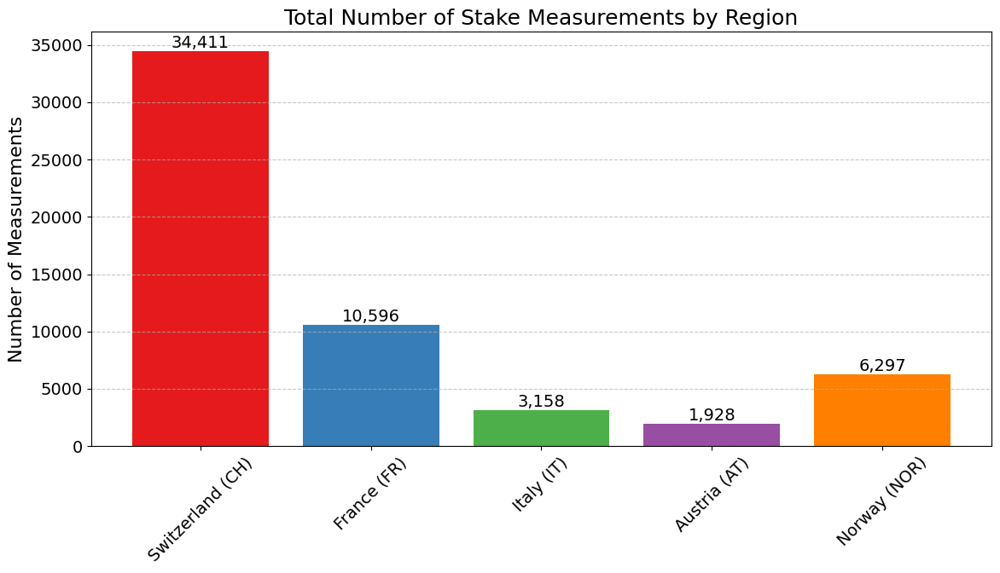

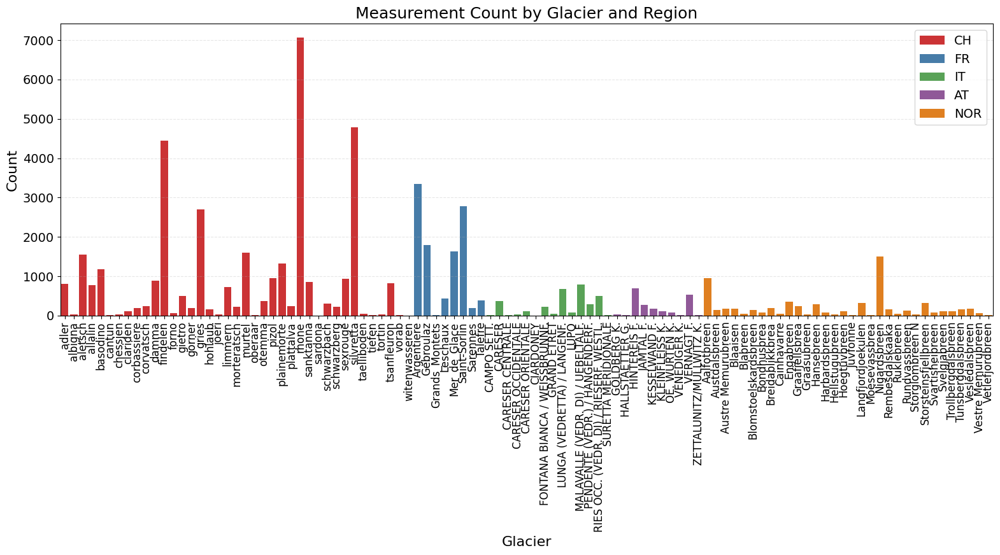

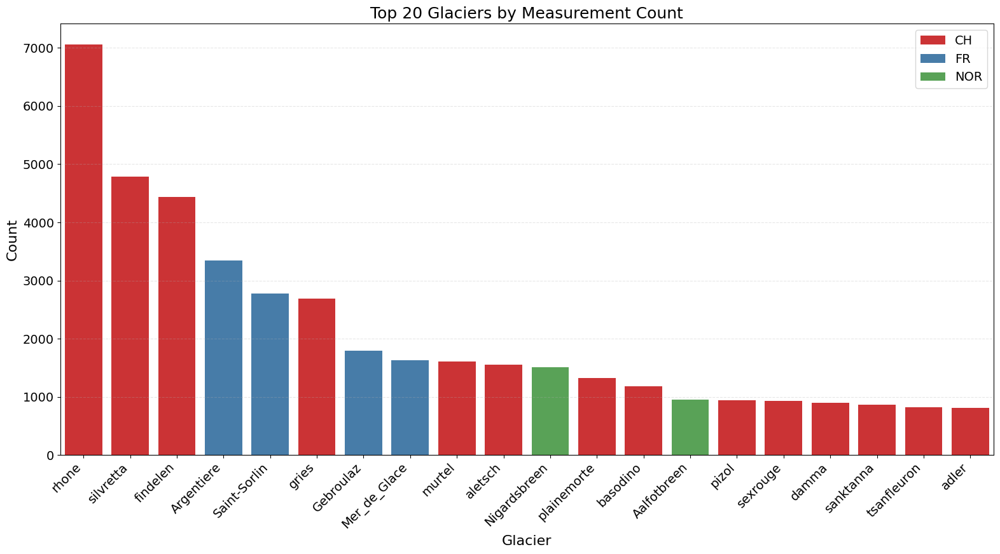

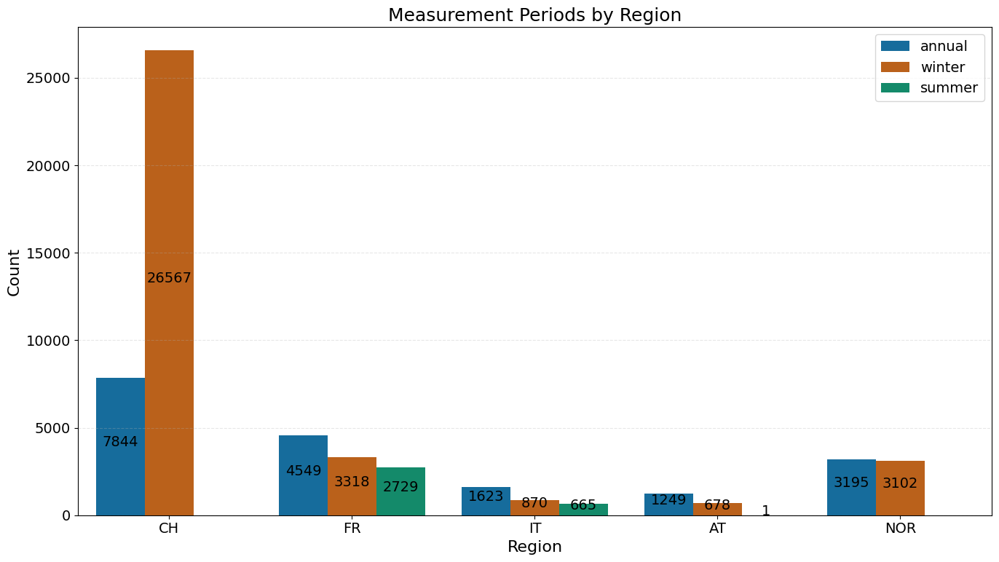

In [62]:
# Set global matplotlib parameters for larger fonts
plt.rcParams.update({
    'font.size': 16,
    'axes.labelsize': 16,
    'axes.titlesize': 18,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 14
})

fontsize = 16  # Increased from 12

### Basic dataset size comparison
dataset_sizes = {
    'Switzerland (CH)': len(data_CH),
    'France (FR)': len(data_FR),
    'Italy (IT)': len(data_IT),
    'Austria (AT)': len(data_AT),
    'Norway (NOR)': len(data_NOR)
}

fig, ax = plt.subplots(figsize=(12, 7))  # Slightly larger figure
bars = ax.bar(dataset_sizes.keys(), dataset_sizes.values(), color=['#e41a1c', '#377eb8', '#4daf4a', '#984ea3', '#ff7f00'])

for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height + 0.1,
            f'{int(height):,}', ha='center', va='bottom', fontsize=14)

ax.set_title('Total Number of Stake Measurements by Region', fontsize=18)
ax.set_ylabel('Number of Measurements', fontsize=16)
plt.xticks(rotation=45, fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

### Number of unique glaciers per region and their measurement counts
glacier_counts = pd.DataFrame()

for name, df in {'CH': data_CH, 'FR': data_FR, 'IT': data_IT, 
                'AT': data_AT, 'NOR': data_NOR}.items():
    # Count measurements per glacier
    gl_counts = df.groupby('GLACIER').size().reset_index()
    gl_counts.columns = ['Glacier', 'Count']
    gl_counts['Region'] = name
    glacier_counts = pd.concat([glacier_counts, gl_counts])

plt.figure(figsize=(16, 9))  # Larger figure
ax = sns.barplot(data=glacier_counts, x='Glacier', y='Count', hue='Region',
                palette=['#e41a1c', '#377eb8', '#4daf4a', '#984ea3', '#ff7f00'])
plt.title('Measurement Count by Glacier and Region', fontsize=18)
plt.xlabel('Glacier', fontsize=16)
plt.ylabel('Count', fontsize=16)
plt.xticks(rotation=90, fontsize=12)  # Smaller font for many x-labels
plt.yticks(fontsize=14)
plt.legend(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()

## Glaciers with most measurements
if len(glacier_counts['Glacier'].unique()) > 20:
    # Alternative plot with top glaciers
    top_glaciers = glacier_counts.sort_values('Count', ascending=False).head(20)
    
    plt.figure(figsize=(16, 9))
    ax = sns.barplot(data=top_glaciers, x='Glacier', y='Count', hue='Region',
                    palette=['#e41a1c', '#377eb8', '#4daf4a', '#984ea3', '#ff7f00'])
    plt.title('Top 20 Glaciers by Measurement Count', fontsize=18)
    plt.xlabel('Glacier', fontsize=16)
    plt.ylabel('Count', fontsize=16)
    plt.xticks(rotation=45, ha='right', fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend(fontsize=14)
    plt.grid(axis='y', linestyle='--', alpha=0.3)
    plt.tight_layout()

### Period distribution (annual, winter, summer)
period_dist = pd.DataFrame()

for name, df in {'CH': data_CH, 'FR': data_FR, 'IT': data_IT, 
                'AT': data_AT, 'NOR': data_NOR}.items():
    pd_counts = df.groupby('PERIOD').size().reset_index()
    pd_counts.columns = ['Period', 'Count']
    pd_counts['Region'] = name
    period_dist = pd.concat([period_dist, pd_counts])

plt.figure(figsize=(14, 8))
ax = sns.barplot(data=period_dist, x='Region', y='Count', hue='Period',
                palette=['#0072B2', '#D55E00', '#009E73'])
plt.title('Measurement Periods by Region', fontsize=18)
plt.xlabel('Region', fontsize=16)
plt.ylabel('Count', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.3)

for i, p in enumerate(ax.patches):
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy() 
    if height > 0:
        ax.annotate(f'{int(height)}', (x + width/2, y + height*0.5), ha='center', fontsize=14)

plt.tight_layout()

###### Summary data

,Region,Total Measurements,Unique Glaciers,Year Range,Elevation Range (m),Mean Annual Balance (m w.e.),Mean Winter Balance (m w.e.),Mean Summer Balance (m w.e.)
0,CH,34411,39,1951-2024,1779-4494,-1.69,1.28,nan
1,FR,10596,8,1957-2022,1610-3570,-2.28,1.14,-3.65
2,IT,3158,14,2006-2024,1812-3411,-1.32,1.16,-2.50
3,AT,1928,10,2012-2024,296-3647,-1.99,1.11,-0.23
4,NOR,6297,32,1962-2021,265-2212,-0.70,2.25,nan


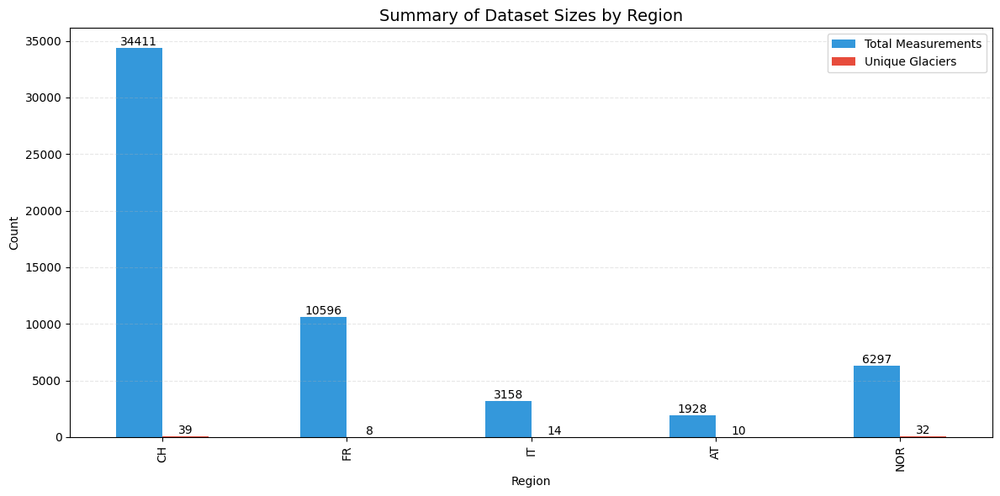

In [ ]:
summary_data = []

for name, df in {'CH': data_CH, 'FR': data_FR, 'IT': data_IT, 
                'AT': data_AT, 'NOR': data_NOR}.items():
    
    # Calculate statistics for this region
    summary = {
        'Region': name,
        'Total Measurements': len(df),
        'Unique Glaciers': df['GLACIER'].nunique(),
        'Year Range': f"{df['YEAR'].min()}-{df['YEAR'].max()}",
        'Elevation Range (m)': f"{int(df['POINT_ELEVATION'].min())}-{int(df['POINT_ELEVATION'].max())}",
        'Mean Annual Balance (m w.e.)': df[df['PERIOD'] == 'annual']['POINT_BALANCE'].mean(),
        'Mean Winter Balance (m w.e.)': df[df['PERIOD'] == 'winter']['POINT_BALANCE'].mean() if 'winter' in df['PERIOD'].values else np.nan,
        'Mean Summer Balance (m w.e.)': df[df['PERIOD'] == 'summer']['POINT_BALANCE'].mean() if 'summer' in df['PERIOD'].values else np.nan,
    }
    
    summary_data.append(summary)

# Create DataFrame from summary data
summary_df = pd.DataFrame(summary_data)

# Display nicely formatted table
display(summary_df.style.format({
    'Mean Annual Balance (m w.e.)': '{:.2f}',
    'Mean Winter Balance (m w.e.)': '{:.2f}',
    'Mean Summer Balance (m w.e.)': '{:.2f}'
}))

# Create a more visually appealing figure version of the summary
fig, ax = plt.subplots(figsize=(12, 6))
summary_plot = summary_df[['Region', 'Total Measurements', 'Unique Glaciers']]
summary_plot.set_index('Region', inplace=True)
summary_plot.plot(kind='bar', ax=ax, color=['#3498db', '#e74c3c'])

# Add the values on top of each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%d')

plt.title('Summary of Dataset Sizes by Region', fontsize=14)
plt.ylabel('Count')
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()

##### Read all csv from "unzipped" into single dictionary of dataframes

##### Plot stakes over map for visual conformation of coordinate transformation

In [41]:
import folium
from folium import plugins

def add_dataset_to_map(data, dataset_name, color, m):
    
    unique_glaciers = data['GLACIER'].unique()
    print(f"Found {len(unique_glaciers)} unique glaciers in {dataset_name}")
    
    for glacier_name in unique_glaciers:
        glacier_data = data[data['GLACIER'] == glacier_name]
        
        max_points = 30  # Maximum number of points to show per glacier
        if len(glacier_data) > max_points:
            glacier_data = glacier_data.sample(max_points, random_state=42)
        
        # Add points to map
        for idx, row in glacier_data.iterrows():
            if 'POINT_ELEVATION' in row:
                altitude = row['POINT_ELEVATION']
            else:
                altitude = 'N/A'
                
            if 'POINT_ID' in row:
                stake_id = row['POINT_ID'].split('_')[-1][:5]
            else:
                stake_id = str(idx)
                
            # Get coordinates
            lat = row['POINT_LAT'] #if 'POINT_LAT' in row else row['lat']
            lon = row['POINT_LON'] #if 'POINT_LON' in row else row['lon']
                
            popup_text = f"""
            Dataset: {dataset_name}<br>
            Glacier: {glacier_name}<br>
            ID: {stake_id}<br>
            Altitude: {altitude}m<br>
            """
            
            # Add marker
            folium.CircleMarker(
                location=[lat, lon],
                radius=5,
                popup=popup_text,
                tooltip=f"{dataset_name} - {glacier_name}",
                color=color,
                fill=True,
                fill_color=color
            ).add_to(m)

colors = {
    'CH': '#e41a1c',   # red
    'FR': '#377eb8',   # blue
    'IT': '#4daf4a',   # green
    'AT': '#984ea3',   # purple
    'NOR': '#ff7f00'   # orange
}

datasets = {
    'CH': data_CH,
    'FR': data_FR, 
    'IT': data_IT,
    'AT': data_AT,
    'NOR': data_NOR
}

all_lats = []
all_lons = []

for name, dataset in datasets.items():
    lat_col = 'POINT_LAT' if 'POINT_LAT' in dataset.columns else 'lat'
    lon_col = 'POINT_LON' if 'POINT_LON' in dataset.columns else 'lon'
    
    if not dataset.empty:
        all_lats.extend(dataset[lat_col].dropna().tolist())
        all_lons.extend(dataset[lon_col].dropna().tolist())


center_lat = 46.0
center_lon = 8.0

# Create map
m = folium.Map(location=[center_lat, center_lon], zoom_start=7)

# Add datasets to map
for name, dataset in datasets.items():
    add_dataset_to_map(dataset, name, colors[name], m)

# Add legend
legend_html = '''
<div style="position: fixed; bottom: 50px; left: 50px; z-index: 1000; background-color: white; padding: 10px; border-radius: 5px;">
    <p><strong>Datasets</strong></p>
'''

for name, color in colors.items():
    legend_html += f'<p><span style="color: {color};">●</span> {name}</p>'

legend_html += '</div>'
m.get_root().html.add_child(folium.Element(legend_html))

# Add fullscreen option and layer control
plugins.Fullscreen().add_to(m)
folium.LayerControl().add_to(m)

# Display the map
m

# Save the map as an HTML file
#m.save('/home/mburlet/MBM/MassBalanceMachine/regions/Overview/glacier_overview_map.html')

Found 39 unique glaciers in CH
Found 8 unique glaciers in FR
Found 14 unique glaciers in IT
Found 10 unique glaciers in AT
Found 32 unique glaciers in NOR


In [ ]:
import folium
from folium import plugins
import matplotlib.colors as mcolors

data_to_plot = data_FR

year_to_plot = 2015

data_year = data_to_plot[data_to_plot['TO_DATE'].astype(str).str[:4] == str(year_to_plot)]

unique_glaciers = data_year['GLACIER'].unique()

# Dynamic Color assignment
color_options = list(mcolors.TABLEAU_COLORS.values())
# Add more colors if needed
color_options.extend(['#e41a1c', '#377eb8', '#4daf4a', '#984ea3', '#ff7f00', '#ffff33', 
                     '#a65628', '#f781bf', '#999999', '#66c2a5', '#fc8d62'])

glacier_colors = {}
for i, glacier in enumerate(unique_glaciers):
    glacier_colors[glacier] = color_options[i % len(color_options)]  # Use modulo to handle more glaciers than colors

# Map center
center_lat = 46.0
center_lon = 8.0

# Create the map
m = folium.Map(location=[center_lat, center_lon], zoom_start=10)

# Function to add markers for a glacier's stakes
def add_glacier_markers(glacier_data, glacier_name):
    # Determine coordinate column names
    lat_col = 'POINT_LAT' #if 'POINT_LAT' in glacier_data.columns else 'lat'
    lon_col = 'POINT_LON' #if 'POINT_LON' in glacier_data.columns else 'lon'
    
    # Get color for the glacier
    color = glacier_colors[glacier_name]
    
    # Add point for each stake
    for idx, row in glacier_data.iterrows():
        # Determine elevation and stake ID
        if 'POINT_ELEVATION' in row:
            altitude = row['POINT_ELEVATION']
        elif 'altitude' in row:
            altitude = row['altitude']
        else:
            altitude = 'N/A'
            
        if 'stake_number' in row:
            stake_id = row['stake_number']
        elif 'POINT_ID' in row:
            stake_id = row['POINT_ID'].split('_')[-1]  # Extract stake number from POINT_ID
        else:
            stake_id = f"Stake {idx}"
            
        # Create popup content
        popup_text = f"""
        Glacier: {glacier_name}<br>
        Year: {year_to_plot}<br>
        Stake: {stake_id}<br>
        Altitude: {altitude}m<br>
        """
        
        if 'POINT_BALANCE' in row:
            popup_text += f"Balance: {row['POINT_BALANCE']} m w.e.<br>"
        
        # Add marker
        folium.CircleMarker(
            location=[row[lat_col], row[lon_col]],
            radius=5,
            popup=popup_text,
            tooltip=f"{glacier_name} - {stake_id}",
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            weight=1
        ).add_to(m)

# Add markers for each glacier's stakes in the selected year
for glacier in unique_glaciers:
    glacier_data = data_year[data_year['GLACIER'] == glacier]
    add_glacier_markers(glacier_data, glacier)

# Add title to the map
title_html = f'''
<h3 align="center" style="font-size:16px"><b>Glacier Stakes in {year_to_plot}</b></h3>
'''
m.get_root().html.add_child(folium.Element(title_html))

# Add legend
legend_html = '''
<div style="position: fixed; bottom: 50px; left: 50px; z-index: 1000; background-color: white; padding: 10px; border-radius: 5px;">
    <p><strong>Glaciers</strong></p>
'''

for glacier, color in glacier_colors.items():
    # Count stakes for this glacier in the selected year
    count = len(data_year[data_year['GLACIER'] == glacier])
    legend_html += f'<p><span style="color: {color};">●</span> {glacier} ({count} stakes)</p>'

legend_html += '</div>'
m.get_root().html.add_child(folium.Element(legend_html))

# Add fullscreen option and layer control
plugins.Fullscreen().add_to(m)
folium.LayerControl().add_to(m)

# Display the map
m

### 2. Individual dataset stats

##### France

,POINT_ID,POINT_LAT,POINT_LON,POINT_ELEVATION,FROM_DATE,TO_DATE,POINT_BALANCE,GLACIER,PERIOD,GLACIER_ZONE,RGIId,YEAR,aspect,slope,topo,hugonnet_dhdt,consensus_ice_thickness,millan_v
0,Argentiere_Tour_Noir_annual_smb_abl_2006_setup...,45.944607,7.024819,3033.52,20050930,20061004,-0.67,Argentiere,annual,Tour Noir,RGI60-11.03638,2006,253.839254,22.267489,3025.0,-1.019441,41.007587,5.479116
1,Argentiere_Tour_Noir_annual_smb_abl_2006_setup...,45.943724,7.022022,2941.68,20050930,20061004,-0.61,Argentiere,annual,Tour Noir,RGI60-11.03638,2006,246.198458,21.827929,2944.0,-1.244668,48.157185,2.614753


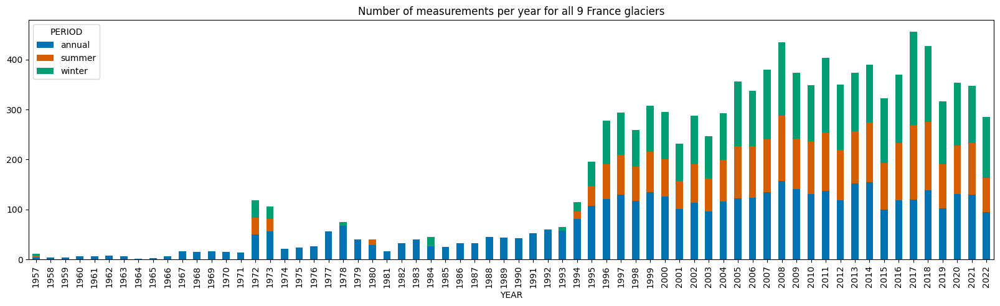

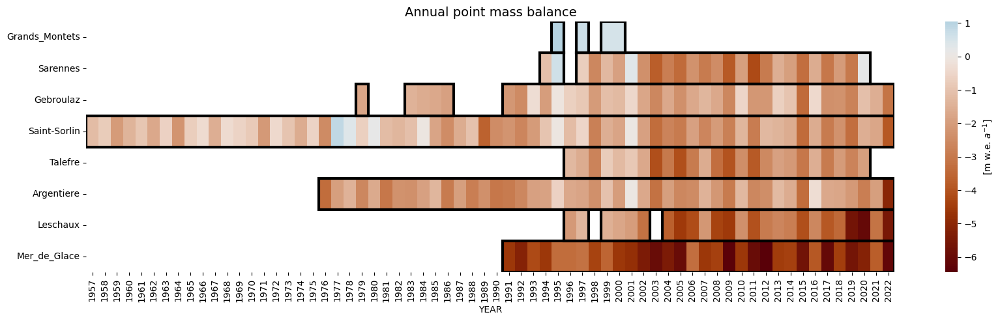

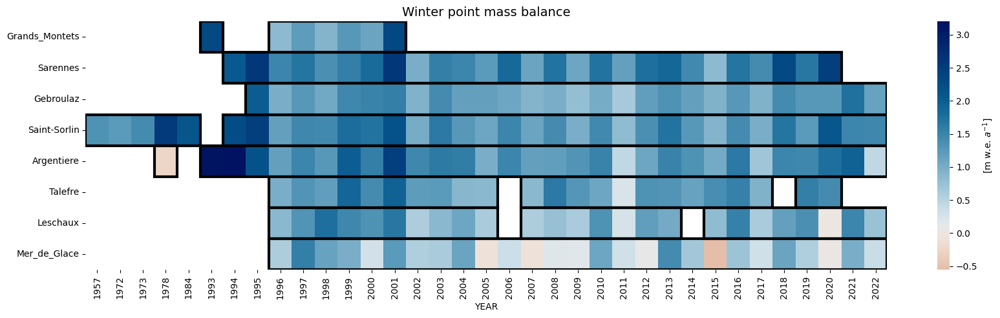

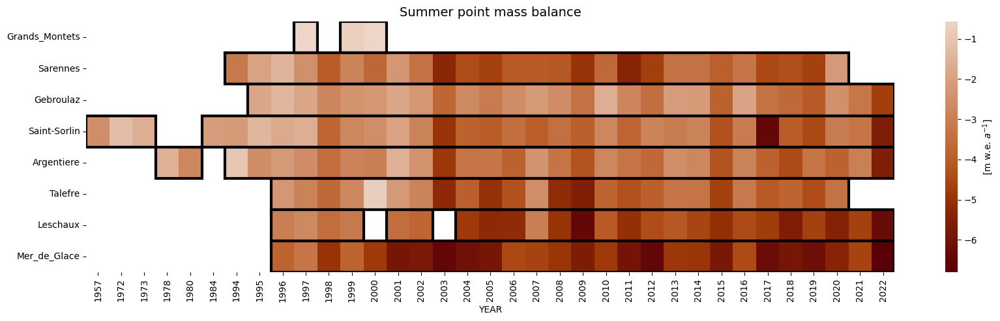

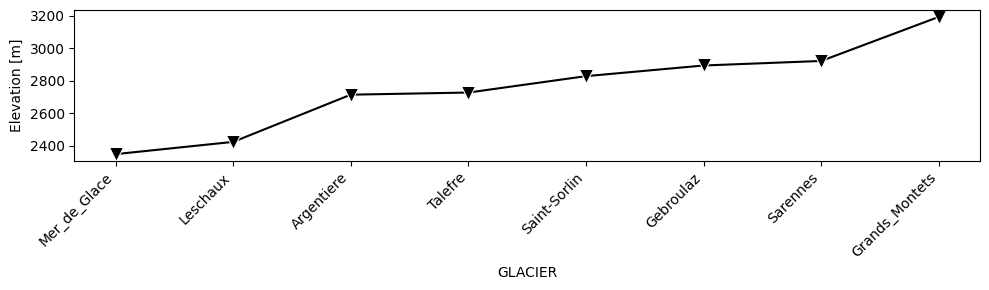

In [8]:
display(data_FR.head(2))

data_FR.groupby(['YEAR', 'PERIOD']).size().unstack().plot(
    kind='bar',
    stacked=True,
    figsize=(20, 5),
    color=['#0072B2', '#D55E00', '#009E73'])
plt.title('Number of measurements per year for all 9 France glaciers')

plotHeatmap(list(data_FR['GLACIER'].unique()), data_FR, period='annual', figsize=(20, 5))

plotHeatmap(list(data_FR['GLACIER'].unique()), data_FR, period='winter', figsize=(20, 5))

plotHeatmap(list(data_FR['GLACIER'].unique()), data_FR, period='summer', figsize=(20, 5))

gl_per_el = data_FR.groupby(['GLACIER'])['POINT_ELEVATION'].mean()
plot_glacier_elevations(gl_per_el)



#### Italy

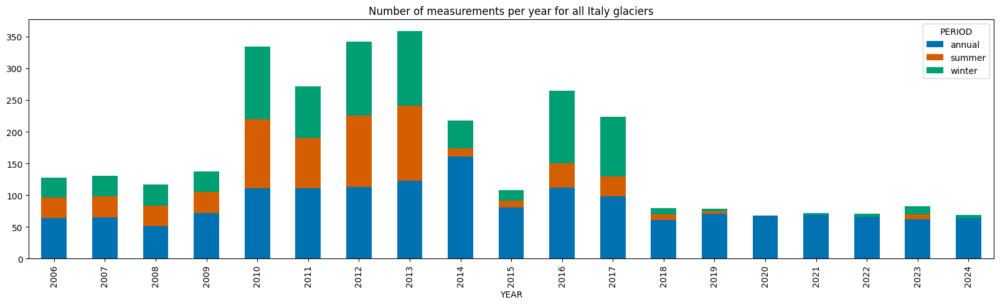

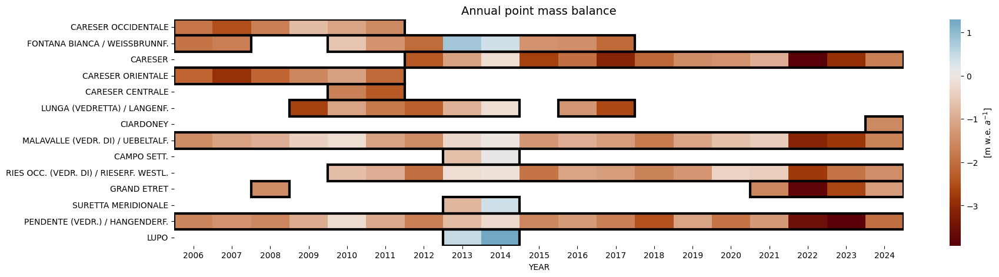

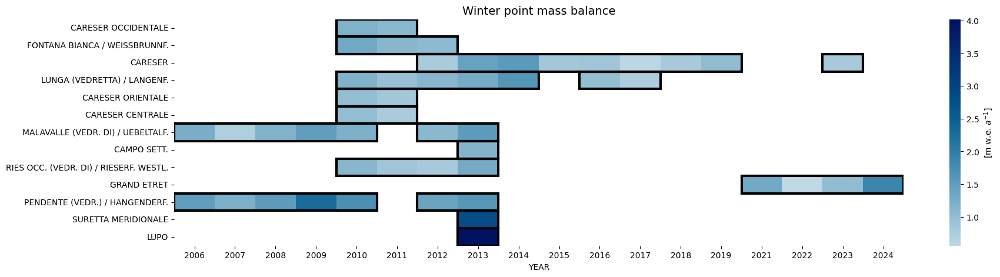

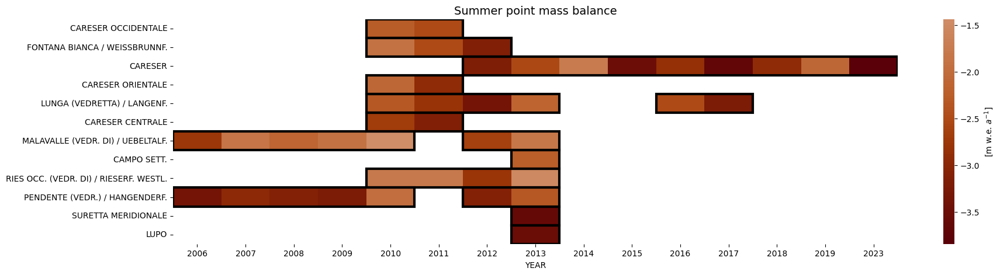

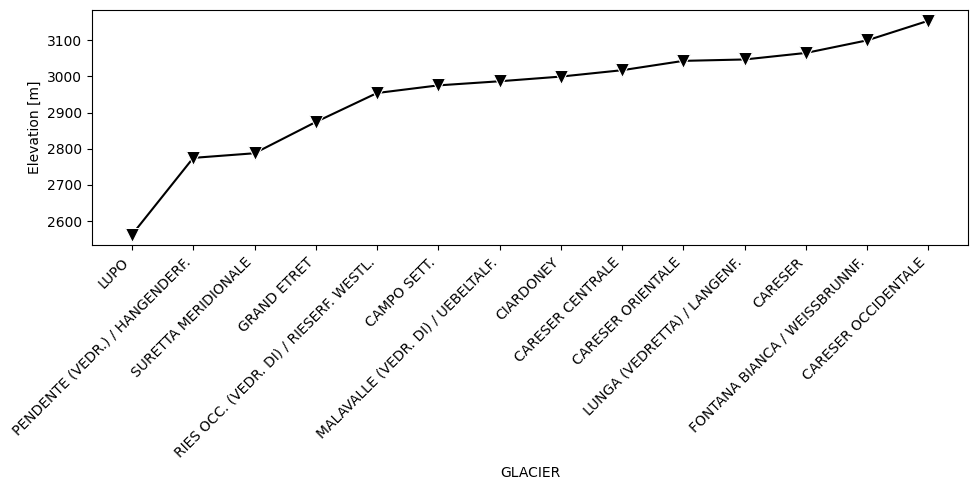

In [30]:
data_IT.groupby(['YEAR', 'PERIOD']).size().unstack().plot(
    kind='bar',
    stacked=True,
    figsize=(20, 5),
    color=['#0072B2', '#D55E00', '#009E73'])
plt.title('Number of measurements per year for all Italy glaciers')

plotHeatmap(list(data_IT['GLACIER'].unique()), data_IT, period='annual', figsize=(20, 5))

plotHeatmap(list(data_IT['GLACIER'].unique()), data_IT, period='winter', figsize=(20, 5))

plotHeatmap(list(data_IT['GLACIER'].unique()), data_IT, period='summer', figsize=(20, 5))

gl_per_el = data_IT.groupby(['GLACIER'])['POINT_ELEVATION'].mean()
plot_glacier_elevations(gl_per_el, figsize =(10,5))

#### Austria

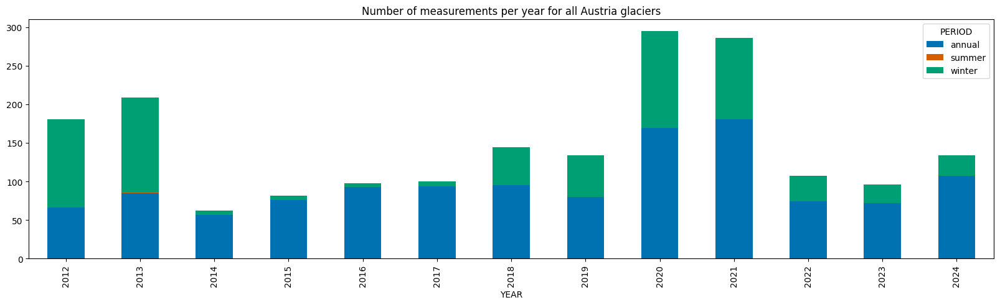

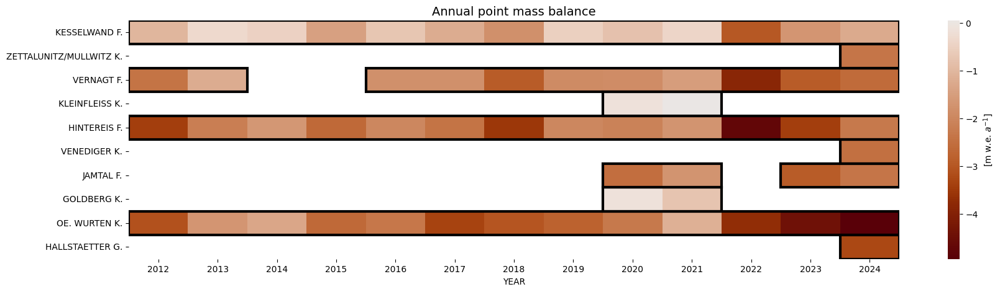

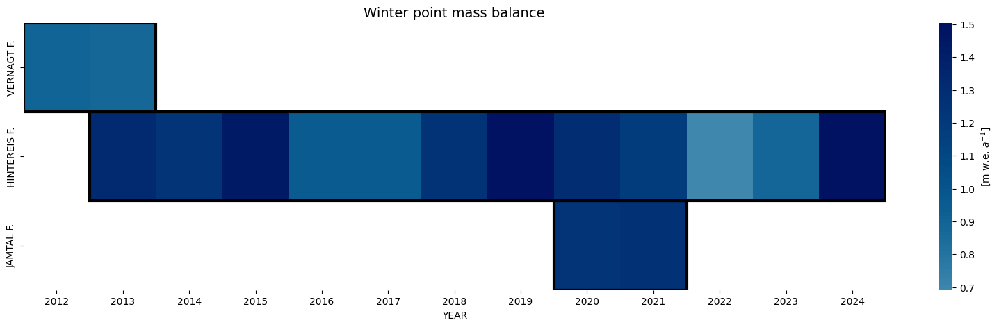

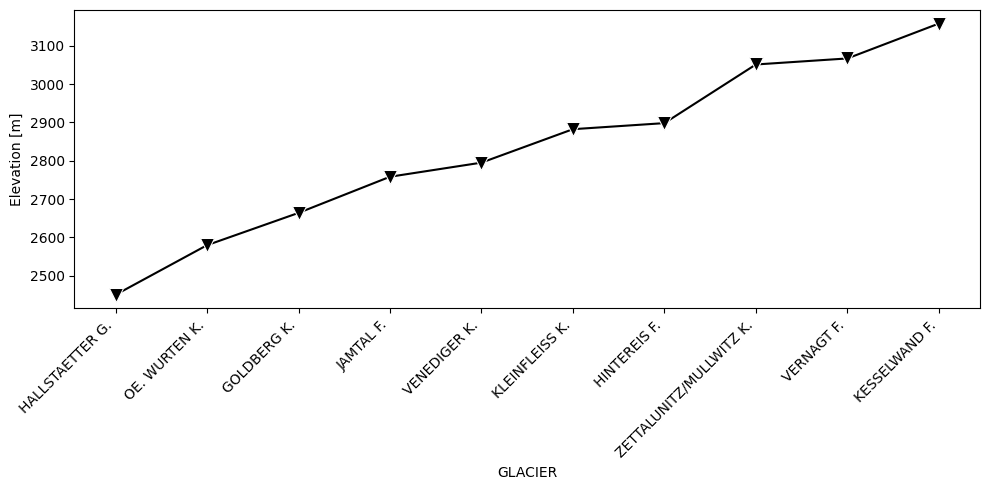

In [29]:
data_AT.groupby(['YEAR', 'PERIOD']).size().unstack().plot(
    kind='bar',
    stacked=True,
    figsize=(20, 5),
    color=['#0072B2', '#D55E00', '#009E73'])
plt.title('Number of measurements per year for all Austria glaciers')

plotHeatmap(list(data_AT['GLACIER'].unique()), data_AT, period='annual', figsize=(20, 5))

plotHeatmap(list(data_AT['GLACIER'].unique()), data_AT, period='winter', figsize=(20, 5))

gl_per_el = data_AT.groupby(['GLACIER'])['POINT_ELEVATION'].mean()
plot_glacier_elevations(gl_per_el, figsize =(10,5))

#### Norway

###### Summer stakes have been preemptively removed, as this dataset is only used for transfer learning CH to NOR

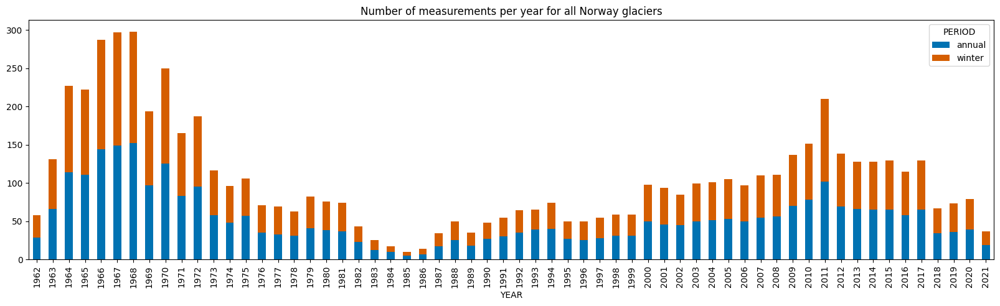

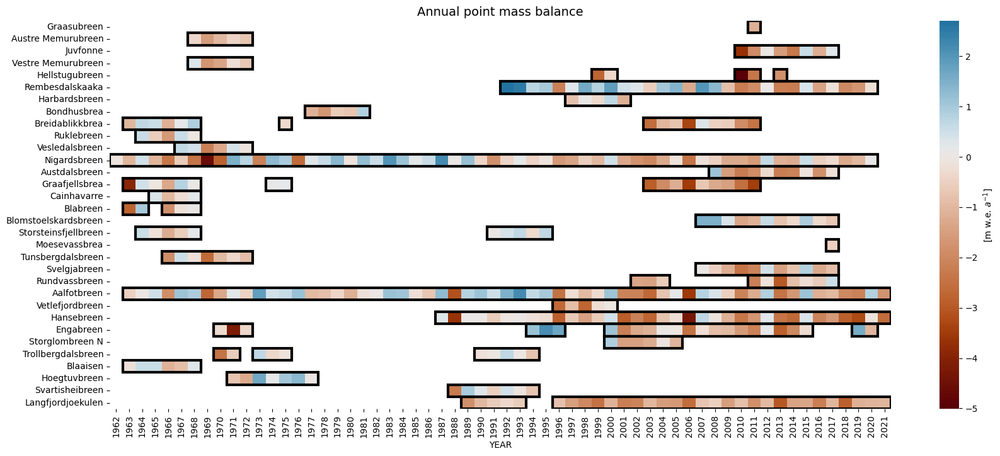

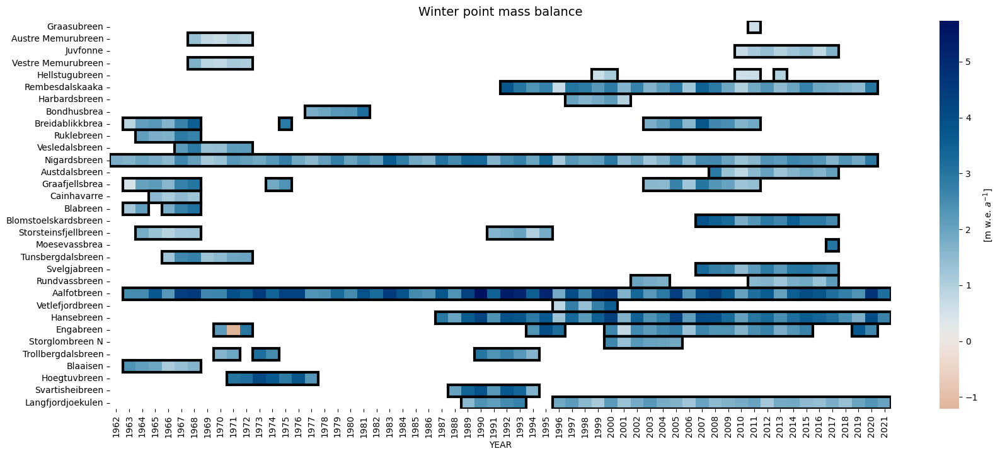

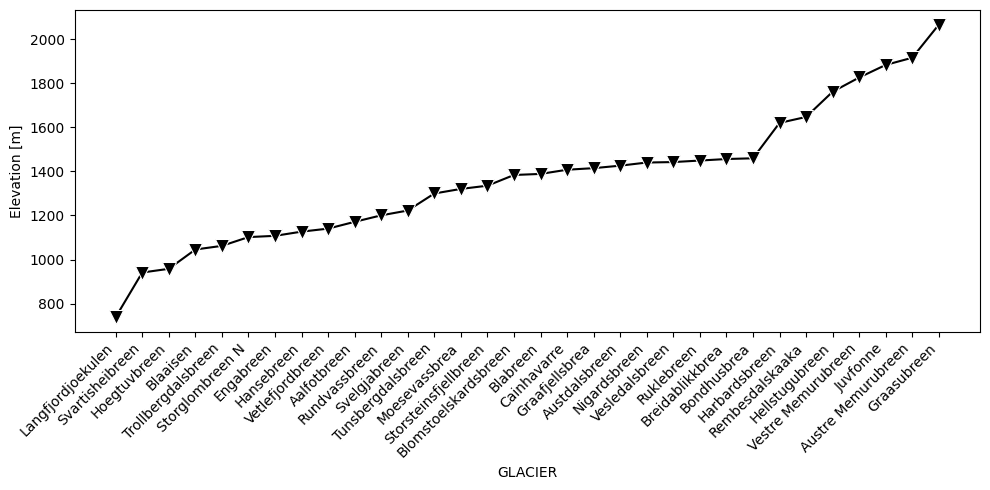

In [ ]:
data_NOR.groupby(['YEAR', 'PERIOD']).size().unstack().plot(
    kind='bar',
    stacked=True,
    figsize=(20, 5),
    color=['#0072B2', '#D55E00', '#009E73'])
plt.title('Number of measurements per year for all Norway glaciers')

plotHeatmap(list(data_NOR['GLACIER'].unique()), data_NOR, period='annual', figsize=(20, 8))

plotHeatmap(list(data_NOR['GLACIER'].unique()), data_NOR, period='winter', figsize=(20, 8))

gl_per_el = data_NOR.groupby(['GLACIER'])['POINT_ELEVATION'].mean()
rplot_glacier_elevations(gl_per_el, figsize =(10,5))

### 3. Results XGBoost split

##### FR split tested on Gebroulaz

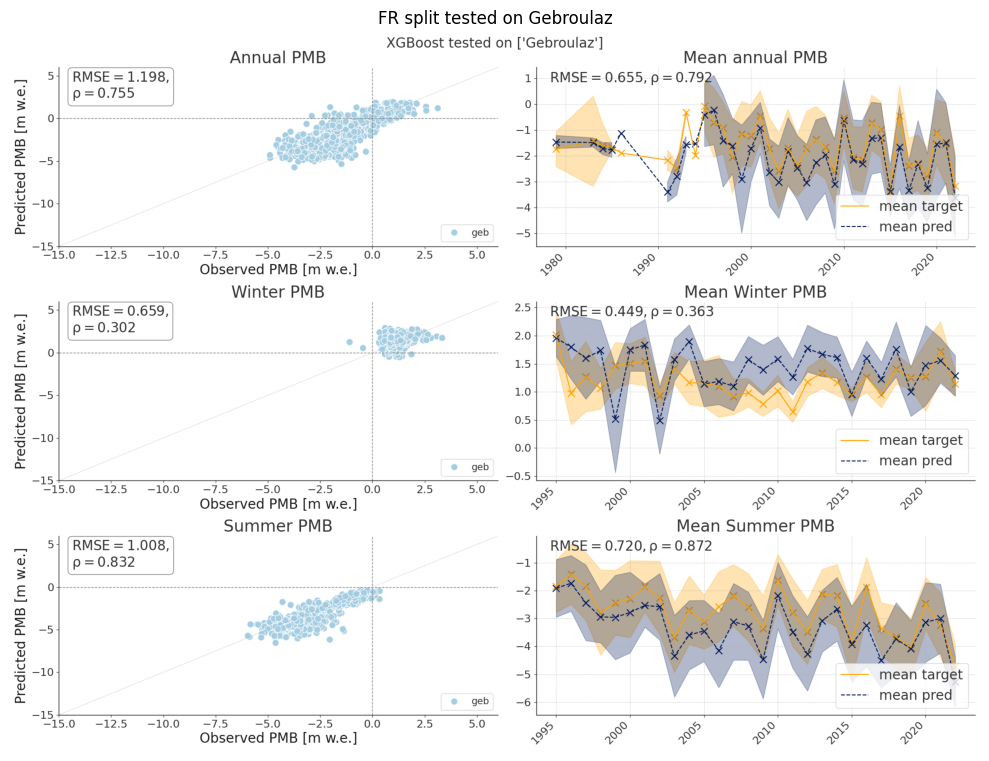

In [53]:
img = mpimg.imread('/home/mburlet/scratch/data/DATA_MB/Outputs/Result_Gebroulaz.png')

plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis('off')
plt.title('FR split tested on Gebroulaz')
plt.tight_layout()
plt.show()

### 4. Result XGBoost transfer

##### CH train FR Test

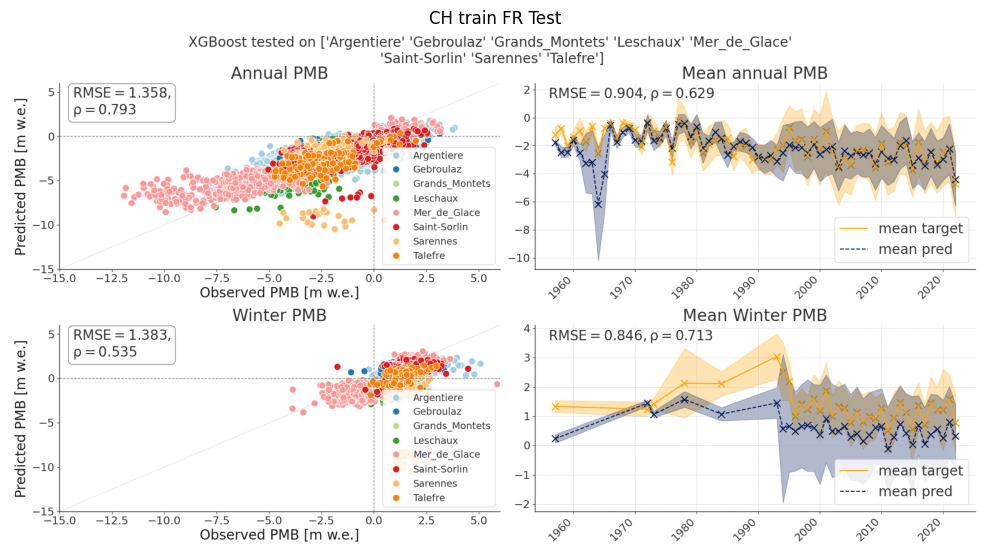

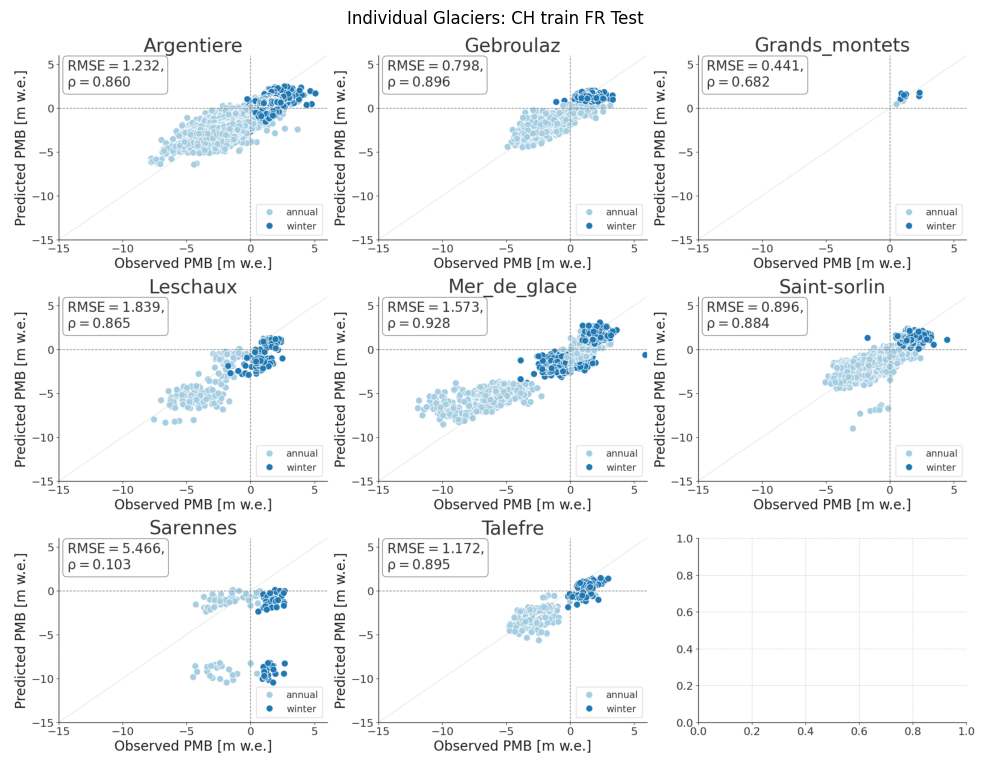

In [ ]:
img = mpimg.imread('/home/mburlet/scratch/data/DATA_MB/Outputs/Result_CH_FR_no_summer.png')

plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis('off')
plt.title('CH train FR Test')
plt.tight_layout()
plt.show()

img2 = mpimg.imread('/home/mburlet/scratch/data/DATA_MB/Outputs/individual_glaciers_CH_FR_no_summer.png')
plt.figure(figsize=(10, 8))
plt.imshow(img2)
plt.axis('off')
plt.title('Individual Glaciers: CH train FR Test')
plt.tight_layout()
plt.show()



##### IT train AT test

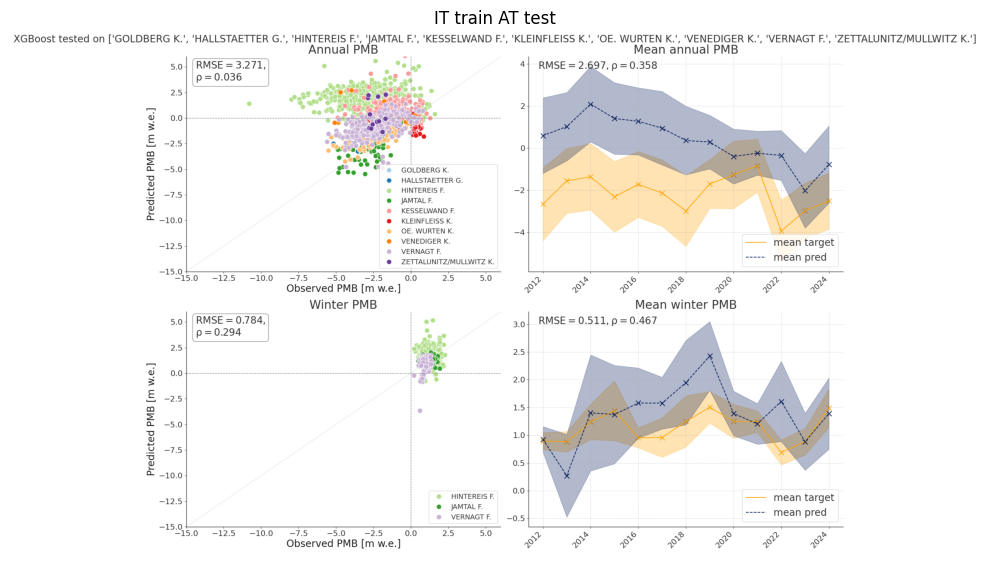

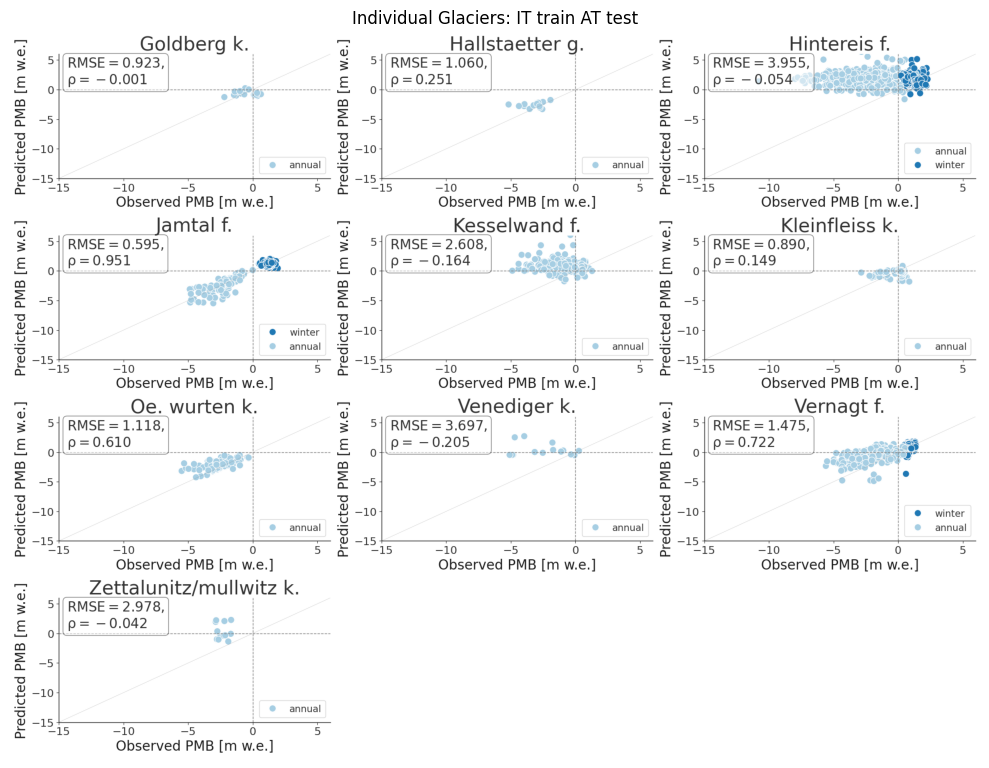

In [56]:
img = mpimg.imread('/home/mburlet/scratch/data/DATA_MB/Outputs/Result_train_IT_test_AT.png')

plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis('off')
plt.title('IT train AT test')
plt.tight_layout()
plt.show()

img2 = mpimg.imread('/home/mburlet/scratch/data/DATA_MB/Outputs/individual_glaciers_train_IT_test_AT.png')
plt.figure(figsize=(10, 8))
plt.imshow(img2)
plt.axis('off')
plt.title('Individual Glaciers: IT train AT test')
plt.tight_layout()
plt.show()

CH train IT & AT test

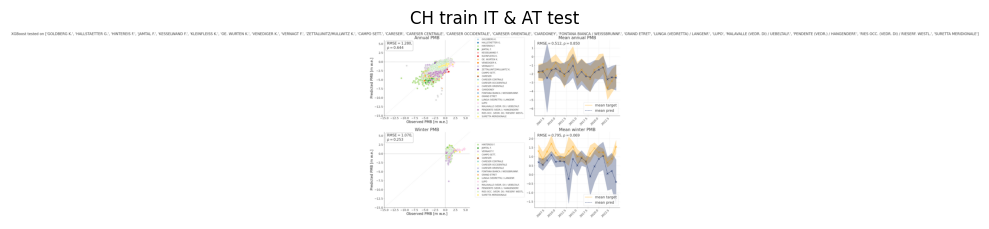

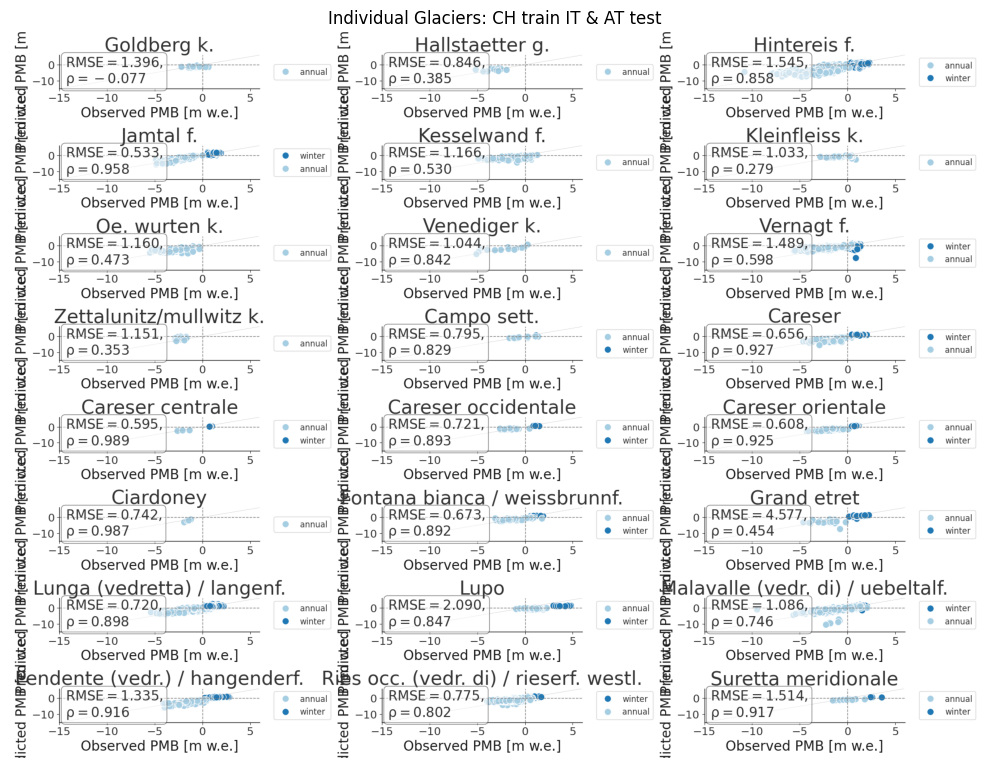

In [58]:
img = mpimg.imread('/home/mburlet/scratch/data/DATA_MB/Outputs/Result_train_CH_test_IT_AT.png')

plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis('off')
plt.title('CH train IT & AT test')
plt.tight_layout()
plt.show()

img2 = mpimg.imread('/home/mburlet/scratch/data/DATA_MB/Outputs/individual_glaciers_train_CH_test_IT_AT.png')
plt.figure(figsize=(10, 8))
plt.imshow(img2)
plt.axis('off')
plt.title('Individual Glaciers: CH train IT & AT test')
plt.tight_layout()
plt.show()

##### CH train NOR test

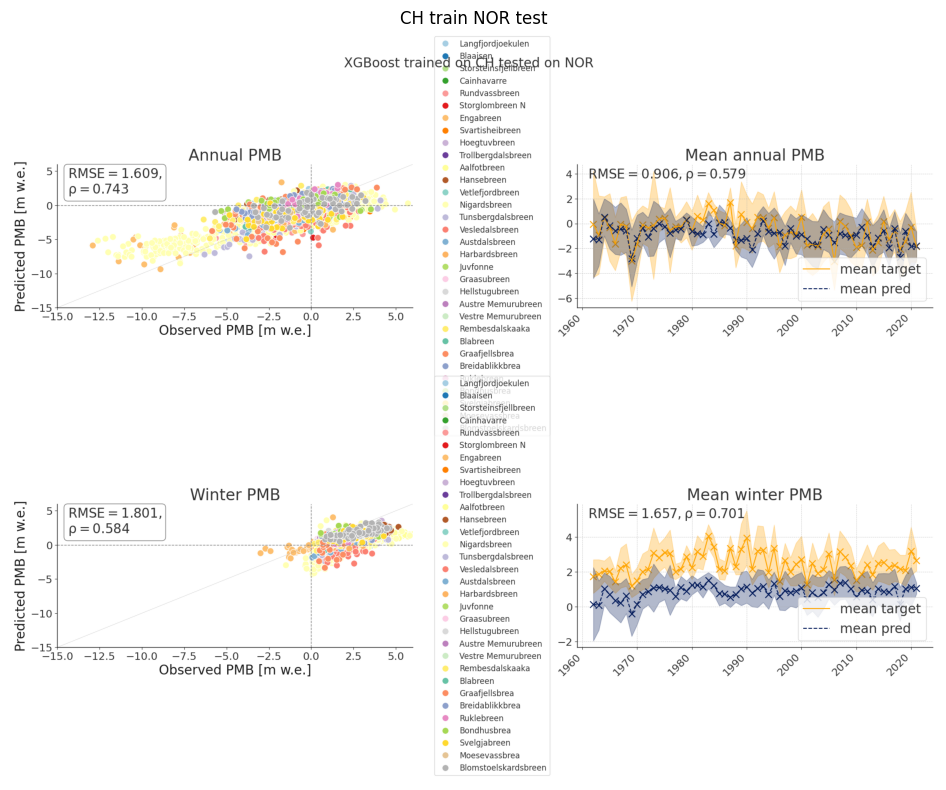

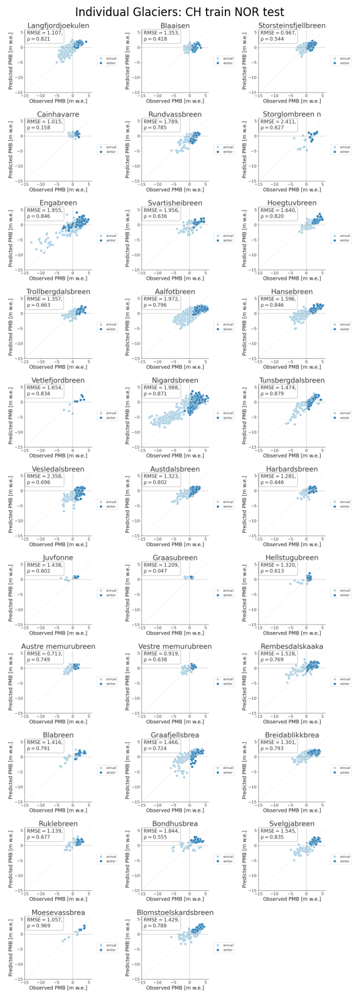

In [61]:
img = mpimg.imread('/home/mburlet/scratch/data/DATA_MB/Outputs/Result_CH_NOR.png')

plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis('off')
plt.title('CH train NOR test')
plt.tight_layout()
plt.show()

img2 = mpimg.imread('/home/mburlet/scratch/data/DATA_MB/Outputs/individual_galciers_CH_NOR.png')
plt.figure(figsize=(20, 15))
plt.imshow(img2)
plt.axis('off')
plt.title('Individual Glaciers: CH train NOR test')
plt.tight_layout()
plt.show()

Possible next steps: 
- clean up regions code, rerun all results
- iceland data and transfer learning test
- NN transfer learning comparison and potential improvement
- WGMS dataset has many more potential regions (worth to look at?)
